# Классификация кекликов

**Цель:** обучить модель, способную различать кекликов по виду.

**Задачи:**

- скачать датасет с помощью файла, содержащего метаданные изображений кекликов. Файл необходимо сконфигурировать на сайте [https://www.inaturalist.org/](https://www.inaturalist.org/);
- разбить датасет на тренировочную и тестовую выборки;
- обучить модель нейронной сети с использованием метода Transfer Learning. 

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.optim.lr_scheduler as lr_scheduler
from torch.optim.lr_scheduler import _LRScheduler
import torch.utils.data as data

import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models

from sklearn import decomposition
from sklearn import manifold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

import copy
from collections import namedtuple
import os
import random
import shutil
import time

In [2]:
data_dir = 'datasets/'

train_dir = os.path.join(data_dir, 'train')
test_dir = os.path.join(data_dir, 'test')

In [3]:
SEED = 1234

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

---

# Чтение данных

Поскольку мы будем использовать предварительно обученную модель, нам нужно убедиться, что наши изображения имеют тот же размер и ту же нормализацию, что и те изображения, которые использовались для обучения модели - их мы находим на странице torchvision [models](https://pytorch.org/vision/stable/models.html).

Мы используем следующие методы аугментации данных: случайное вращение, отражение по горизонтали и обрезка.

In [4]:
pretrained_size = 224
pretrained_means = [0.485, 0.456, 0.406]
pretrained_stds= [0.229, 0.224, 0.225]

train_transforms = transforms.Compose([
                           transforms.Resize(pretrained_size),
                           transforms.RandomRotation(5),
                           transforms.RandomHorizontalFlip(0.5),
                           transforms.RandomCrop(pretrained_size, padding = 10),
                           transforms.ToTensor(),
                           transforms.Normalize(mean = pretrained_means, 
                                                std = pretrained_stds)
                       ])

test_transforms = transforms.Compose([
                           transforms.Resize(pretrained_size),
                           transforms.CenterCrop(pretrained_size),
                           transforms.ToTensor(),
                           transforms.Normalize(mean = pretrained_means, 
                                                std = pretrained_stds)
                       ])

Мы загружаем наши данные с помощью трансформаций

In [5]:
train_data = datasets.ImageFolder(root = train_dir, 
                                  transform = train_transforms)

test_data = datasets.ImageFolder(root = test_dir, 
                                 transform = test_transforms)

Создаем валидационную выборку

In [6]:
VALID_RATIO = 0.9

n_train_examples = int(len(train_data) * VALID_RATIO)
n_valid_examples = len(train_data) - n_train_examples

train_data, valid_data = data.random_split(train_data, 
                                           [n_train_examples, n_valid_examples])

Перезапишем трансформации валидационной выборки, обязательно сделав `глубокую копию`, чтобы это не привело к изменению преобразований обучающих данных.

In [7]:
valid_data = copy.deepcopy(valid_data)
valid_data.dataset.transform = test_transforms

Проверяем правильность всех проведенных разделений

In [8]:
print(f'Number of training examples: {len(train_data)}')
print(f'Number of validation examples: {len(valid_data)}')
print(f'Number of testing examples: {len(test_data)}')
print(f'Total number of examples: {len(test_data) + len(valid_data) + len(train_data)}')

Number of training examples: 6038
Number of validation examples: 671
Number of testing examples: 1680
Total number of examples: 8389


Далее создадим итераторы с наибольшим размером батча, который поместится на GPU. 

In [9]:
BATCH_SIZE = 32

train_iterator = data.DataLoader(train_data, 
                                 shuffle = True, 
                                 batch_size = BATCH_SIZE)

valid_iterator = data.DataLoader(valid_data, 
                                 batch_size = BATCH_SIZE)

test_iterator = data.DataLoader(test_data, 
                                batch_size = BATCH_SIZE)

Чтобы убедиться, что изображения были обработаны правильно, построим график нескольких из них - при этом мы заново нормализуем изображения, чтобы их цвета выглядели правильно.

In [10]:
def normalize_image(image):
    image_min = image.min()
    image_max = image.max()
    image.clamp_(min = image_min, max = image_max)
    image.add_(-image_min).div_(image_max - image_min + 1e-5)
    return image    

In [11]:
def plot_images(images, labels, classes, normalize = True):

    n_images = len(images)

    rows = int(np.sqrt(n_images))
    cols = int(np.sqrt(n_images))

    fig = plt.figure(figsize = (15, 15))

    for i in range(rows*cols):

        ax = fig.add_subplot(rows, cols, i+1)
        
        image = images[i]

        if normalize:
            image = normalize_image(image)

        ax.imshow(image.permute(1, 2, 0).cpu().numpy())
        label = classes[labels[i]]
        ax.set_title(label)
        ax.axis('off')

Мы видим, что изображения выглядят нормально.

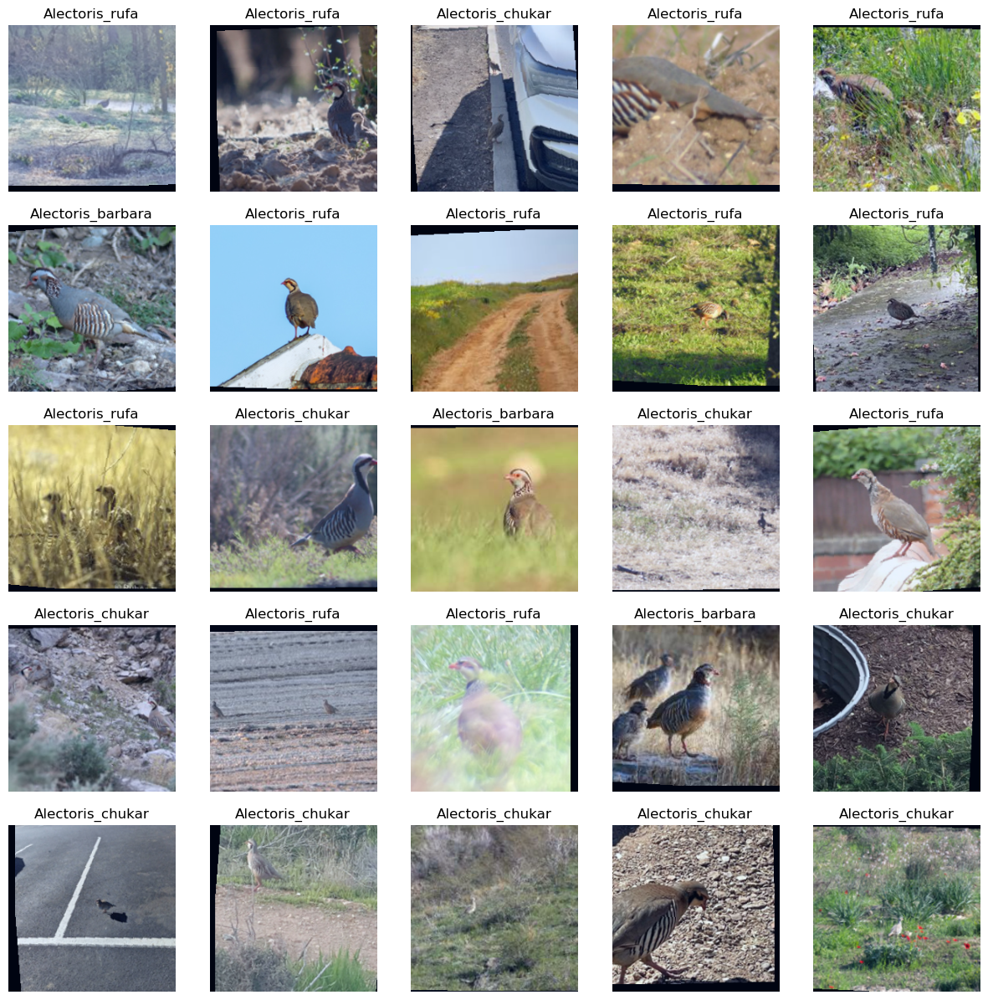

In [12]:
N_IMAGES = 25

images, labels = zip(*[(image, label) for image, label in 
                           [train_data[i] for i in range(N_IMAGES)]])

classes = test_data.classes

plot_images(images, labels, classes)

# Объявление модели

In [13]:
class ResNet(nn.Module):
    def __init__(self, config, output_dim):
        super().__init__()
                
        block, n_blocks, channels = config
        self.in_channels = channels[0]
            
        assert len(n_blocks) == len(channels) == 4
        
        self.conv1 = nn.Conv2d(3, self.in_channels, kernel_size = 7, stride = 2, padding = 3, bias = False)
        self.bn1 = nn.BatchNorm2d(self.in_channels)
        self.relu = nn.ReLU(inplace = True)
        self.maxpool = nn.MaxPool2d(kernel_size = 3, stride = 2, padding = 1)
        
        self.layer1 = self.get_resnet_layer(block, n_blocks[0], channels[0])
        self.layer2 = self.get_resnet_layer(block, n_blocks[1], channels[1], stride = 2)
        self.layer3 = self.get_resnet_layer(block, n_blocks[2], channels[2], stride = 2)
        self.layer4 = self.get_resnet_layer(block, n_blocks[3], channels[3], stride = 2)
        
        self.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.fc = nn.Linear(self.in_channels, output_dim)
        
    def get_resnet_layer(self, block, n_blocks, channels, stride = 1):
    
        layers = []
        
        if self.in_channels != block.expansion * channels:
            downsample = True
        else:
            downsample = False
        
        layers.append(block(self.in_channels, channels, stride, downsample))
        
        for i in range(1, n_blocks):
            layers.append(block(block.expansion * channels, channels))

        self.in_channels = block.expansion * channels
            
        return nn.Sequential(*layers)
        
    def forward(self, x):
        
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        
        x = self.avgpool(x)
        h = x.view(x.shape[0], -1)
        x = self.fc(h)
        
        return x, h

Первый - это `BasicBlock`. 

`BasicBlock` состоит из двух сверточных слоев 3x3. Первый, `conv1`, имеет `stride`, который меняется в зависимости от слоя (один в первом слое и два в остальных), в то время как второй, `conv2`, всегда имеет `stride` равный единице. Каждый из слоев имеет `padding`, равный единице - это означает, что перед применением фильтров к входному изображению мы добавляем один пиксель, равный нулю в каждом канале, вокруг всего изображения. За каждым сверточным слоем следует функция активации ReLU и батч-нормализация. 

Логичнее использовать пакетную нормализацию после функции активации, а не перед ней. Однако в оригинальных моделях ResNet пакетная нормализация использовалась до активации, поэтому мы также используем ее здесь.

При понижающей дискретизации мы добавляем к остаточному пути сверточный слой с фильтром 1x1, и без паддинга. Он также имеет переменную `stride`, и за ним следует батч-нормализация. При значении stride, равном единице, фильтр 1x1 не изменяет высоту и ширину изображения - он просто имеет `out_channels` количество фильтров, каждый из которых имеет глубину `in_channels`, то есть он увеличивает количество каналов в изображении с помощью линейной проекции и фактически не производит даунсэмплинг вообще. С шагом два он уменьшает высоту и ширину изображения на два, так как фильтр 1x1 проходит только через каждый второй пиксель - на этот раз он действительно понижает дискретизацию изображения, а также выполняет линейную проекцию каналов.

У `BasicBlock` `expansion` равно единице, поскольку количество фильтров, используемых каждым из конволюционных слоев в блоке, одинаково.

In [14]:
class BasicBlock(nn.Module):
    
    expansion = 1
    
    def __init__(self, in_channels, out_channels, stride = 1, downsample = False):
        super().__init__()
                
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size = 3, 
                               stride = stride, padding = 1, bias = False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size = 3, 
                               stride = 1, padding = 1, bias = False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        
        self.relu = nn.ReLU(inplace = True)
        
        if downsample:
            conv = nn.Conv2d(in_channels, out_channels, kernel_size = 1, 
                             stride = stride, bias = False)
            bn = nn.BatchNorm2d(out_channels)
            downsample = nn.Sequential(conv, bn)
        else:
            downsample = None
        
        self.downsample = downsample
        
    def forward(self, x):
        
        i = x
        
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        
        x = self.conv2(x)
        x = self.bn2(x)
        
        if self.downsample is not None:
            i = self.downsample(i)
                        
        x += i
        x = self.relu(x)
        
        return x

Перед блоком `Bottleneck` сначала покажем, как создавать конфигурации для моделей ResNet.

Вместо того чтобы использовать простой список, как это делается для модели VGG, будем использовать `namedtuple`. В нем будут храниться: класс блока, количество блоков в каждом слое и количество каналов в каждом слое.

In [15]:
ResNetConfig = namedtuple('ResNetConfig', ['block', 'n_blocks', 'channels'])

Из таблицы конфигурации ResNet мы можем создать следующие конфигурации для ResNet18 и ResNet34. Важно заметить, что указанные `каналы` не меняются в разных конфигурациях, только количество блоков, используемых в каждом слое.

Затем мы можем определить модели ResNet18 и ResNet34 с помощью:

```python
resnet18 = ResNet(resnet18_config, output_dim)
resnet34 = ResNet(resnet34_config, output_dim)
```

In [16]:
resnet18_config = ResNetConfig(block = BasicBlock,
                               n_blocks = [2,2,2,2],
                               channels = [64, 128, 256, 512])

resnet34_config = ResNetConfig(block = BasicBlock,
                               n_blocks = [3,4,6,3],
                               channels = [64, 128, 256, 512])

Блок `Bottleneck`, используемый для ResNet50, ResNet101 и ResNet152. 

Вместо двух конволюционных слоев 3x3 он имеет конволюционный слой 1x1, 3x3 и затем еще один конволюционный слой 1x1. Только конволюционный слой 3x3 имеет переменную ширину и паддинг, в то время как фильтры 1x1 имеют шаг, равный единице, и не имеют паддинга.

Первый фильтр 1x1, `conv1`, используется для уменьшения количества каналов во всех слоях, кроме первого, где количество каналов остается прежним, например, в первом блоке второго слоя количество каналов уменьшается с 256 до 128. В случае, когда фильтр 1x1 уменьшает количество каналов, его можно рассматривать как слой объединения по размерности каналов, но вместо того, чтобы выполнять простую операцию максимума или среднего, он учится - с помощью своих весов - тому, как наиболее эффективно уменьшить размерность. Уменьшение размерности также полезно для того, чтобы просто уменьшить количество параметров в модели и сделать ее пригодной для обучения.

Второй фильтр 1x1, `conv3`, используется для увеличения числа каналов - аналогично конволюционному слою в пути понижающей дискретизации.

Блок `Bottleneck` имеет значение `expansion`, равное четырем, что означает, что количество каналов в изображении, выводимом блоком, равно не `out_channels`, а `expansion * out_channels`. 

Конволюционный слой с понижающей дискретизацией аналогичен тому, что используется в `BasicBlock`, с учетом коэффициента `expansion`.

In [17]:
class Bottleneck(nn.Module):
    
    expansion = 4
    
    def __init__(self, in_channels, out_channels, stride = 1, downsample = False):
        super().__init__()
    
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size = 1, 
                               stride = 1, bias = False)
        self.bn1 = nn.BatchNorm2d(out_channels)
        
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size = 3, 
                               stride = stride, padding = 1, bias = False)
        self.bn2 = nn.BatchNorm2d(out_channels)
        
        self.conv3 = nn.Conv2d(out_channels, self.expansion * out_channels, kernel_size = 1,
                               stride = 1, bias = False)
        self.bn3 = nn.BatchNorm2d(self.expansion * out_channels)
        
        self.relu = nn.ReLU(inplace = True)
        
        if downsample:
            conv = nn.Conv2d(in_channels, self.expansion * out_channels, kernel_size = 1, 
                             stride = stride, bias = False)
            bn = nn.BatchNorm2d(self.expansion * out_channels)
            downsample = nn.Sequential(conv, bn)
        else:
            downsample = None
            
        self.downsample = downsample
        
    def forward(self, x):
        
        i = x
        
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)
        
        x = self.conv3(x)
        x = self.bn3(x)
                
        if self.downsample is not None:
            i = self.downsample(i)
            
        x += i
        x = self.relu(x)
    
        return x

Ниже приведены конфигурации для моделей ResNet50, ResNet101 и ResNet152. 

Как и в моделях ResNet18 и ResNet34, `каналы` не меняются между конфигурациями, только количество блоков в каждом слое.

Мы можем использовать конфигурации для получения реальных моделей следующим образом:

```python
resnet50  = ResNet(resnet50_config, output_dim)
resnet101 = ResNet(resnet101_config, output_dim)
resnet152 = ResNet(resnet152_config, output_dim)
```

In [18]:
resnet50_config = ResNetConfig(block = Bottleneck,
                               n_blocks = [3, 4, 6, 3],
                               channels = [64, 128, 256, 512])

resnet101_config = ResNetConfig(block = Bottleneck,
                                n_blocks = [3, 4, 23, 3],
                                channels = [64, 128, 256, 512])

resnet152_config = ResNetConfig(block = Bottleneck,
                                n_blocks = [3, 8, 36, 3],
                                channels = [64, 128, 256, 512])

Выберем ResNet50, так как это наиболее часто используемый вариант ResNet. 

Поскольку у нас относительно небольшой набор данных - 8 389 изображений - с очень небольшим количеством примеров для некоторых классов, будем использовать предварительно обученную модель.

Torchvision предоставляет предварительно обученные модели для всех стандартных вариантов ResNet.

Сначала загрузим предварительно обученную модель ResNet.

In [19]:
pretrained_model = models.resnet50(pretrained = True)

D:\Anaconda\envs\cnn\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
D:\Anaconda\envs\cnn\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Мы видим, что конечный линейный слой для классификации, `fc`, имеет 1000-мерный выход, поскольку он был предварительно обучен на наборе данных ImageNet, который содержит 1000 классов. 

In [20]:
print(pretrained_model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

Однако в моем наборе данных всего 7 классов, поэтому сначала создадим новый линейный слой с необходимыми размерами.

In [21]:
IN_FEATURES = pretrained_model.fc.in_features 
OUTPUT_DIM = len(test_data.classes)

fc = nn.Linear(IN_FEATURES, OUTPUT_DIM)

Затем мы заменяем линейный слой предварительно обученной модели нашим собственным линейным слоем, инициализированным случайным образом.

In [22]:
pretrained_model.fc = fc

Предварительно обученная модель ResNet, предоставляемая torchvision, не дает промежуточного вывода, который мы хотели бы потенциально использовать для анализа. Мы решаем эту проблему, инициализируя нашу собственную модель ResNet50, а затем копируя предварительно обученные параметры в нашу модель.

Затем мы инициализируем нашу модель ResNet50 из конфигурации...

In [23]:
model = ResNet(resnet50_config, OUTPUT_DIM)

... а затем мы загружаем параметры (в PyTorch они называются `state_dict`) предварительно обученной модели в нашу модель.

Это также хорошая проверка на вменяемость, чтобы убедиться, что наша модель ResNet соответствует модели, используемой torchvision.

In [24]:
model.load_state_dict(pretrained_model.state_dict())

<All keys matched successfully>

Мы также можем увидеть количество параметров в нашей модели (интересно, что в ResNet50 всего ~24M параметров по сравнению с ~129M в VGG11. В основном это связано с отсутствием линейных слоев высокой размерности, которые были заменены более эффективными по параметрам конволюционными слоями).

In [25]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f'The model has {count_parameters(model):,} trainable parameters')

The model has 23,522,375 trainable parameters


# Обучение модели

Перейдем к обучению модели. Воспользуемся функцией поиска скорости обучения, чтобы установить подходящую скорость обучения для модели.

Начнем с инициализации оптимизатора с очень низкой скоростью обучения, определения функции потерь (`критерий`) и устройства, а затем поместим модель и функцию потерь в устройство.

In [26]:
START_LR = 1e-7

optimizer = optim.Adam(model.parameters(), lr=START_LR)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

criterion = nn.CrossEntropyLoss()

model = model.to(device)
criterion = criterion.to(device)

Определяем класс поиска скорости обучения.

In [27]:
class LRFinder:
    def __init__(self, model, optimizer, criterion, device):
        
        self.optimizer = optimizer
        self.model = model
        self.criterion = criterion
        self.device = device
        
        torch.save(model.state_dict(), 'init_params.pt')

    def range_test(self, iterator, end_lr = 10, num_iter = 100, 
                   smooth_f = 0.05, diverge_th = 5):
        
        lrs = []
        losses = []
        best_loss = float('inf')

        lr_scheduler = ExponentialLR(self.optimizer, end_lr, num_iter)
        
        iterator = IteratorWrapper(iterator)
        
        for iteration in range(num_iter):

            loss = self._train_batch(iterator)

            #update lr
            lr_scheduler.step()
            
            lrs.append(lr_scheduler.get_lr()[0])

            if iteration > 0:
                loss = smooth_f * loss + (1 - smooth_f) * losses[-1]
                
            if loss < best_loss:
                best_loss = loss

            losses.append(loss)
            
            if loss > diverge_th * best_loss:
                print("Stopping early, the loss has diverged")
                break
                       
        #reset model to initial parameters
        model.load_state_dict(torch.load('init_params.pt'))
                    
        return lrs, losses

    def _train_batch(self, iterator):
        
        self.model.train()
        
        self.optimizer.zero_grad()
        
        x, y = iterator.get_batch()
        
        x = x.to(self.device)
        y = y.to(self.device)
        
        y_pred, _ = self.model(x)
                
        loss = self.criterion(y_pred, y)
        
        loss.backward()
        
        self.optimizer.step()
        
        return loss.item()

class ExponentialLR(_LRScheduler):
    def __init__(self, optimizer, end_lr, num_iter, last_epoch=-1):
        self.end_lr = end_lr
        self.num_iter = num_iter
        super(ExponentialLR, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        curr_iter = self.last_epoch + 1
        r = curr_iter / self.num_iter
        return [base_lr * (self.end_lr / base_lr) ** r for base_lr in self.base_lrs]

class IteratorWrapper:
    def __init__(self, iterator):
        self.iterator = iterator
        self._iterator = iter(iterator)

    def __next__(self):
        try:
            inputs, labels = next(self._iterator)
        except StopIteration:
            self._iterator = iter(self.iterator)
            inputs, labels, *_ = next(self._iterator)

        return inputs, labels

    def get_batch(self):
        return next(self)

Затем определяем скорость обучения и проводим range test.

In [28]:
END_LR = 10
NUM_ITER = 100

lr_finder = LRFinder(model, optimizer, criterion, device)
lrs, losses = lr_finder.range_test(train_iterator, END_LR, NUM_ITER) # !!! c BATCH SIZE = 64 выдало ошибку CUDA error: CUBLAS_STATUS_ALLOC_FAILED when calling cublasCreate(handle)

Stopping early, the loss has diverged


Далее мы определяем функцию для построения графика результатов range test'a.

In [30]:
def plot_lr_finder(lrs, losses, skip_start = 5, skip_end = 5):
    
    if skip_end == 0:
        lrs = lrs[skip_start:]
        losses = losses[skip_start:]
    else:
        lrs = lrs[skip_start:-skip_end]
        losses = losses[skip_start:-skip_end]
    
    fig = plt.figure(figsize = (16,8))
    ax = fig.add_subplot(1,1,1)
    ax.plot(lrs, losses)
    ax.set_xscale('log')
    ax.set_xlabel('Learning rate')
    ax.set_ylabel('Loss')
    ax.grid(True, 'both', 'x')
    plt.show()

Мы видим, что потери достигают минимума примерно при $3x10^{-3}$.

Хорошей скоростью обучения здесь будет середина самой крутой нисходящей кривой - около $1x10^{-3}$.

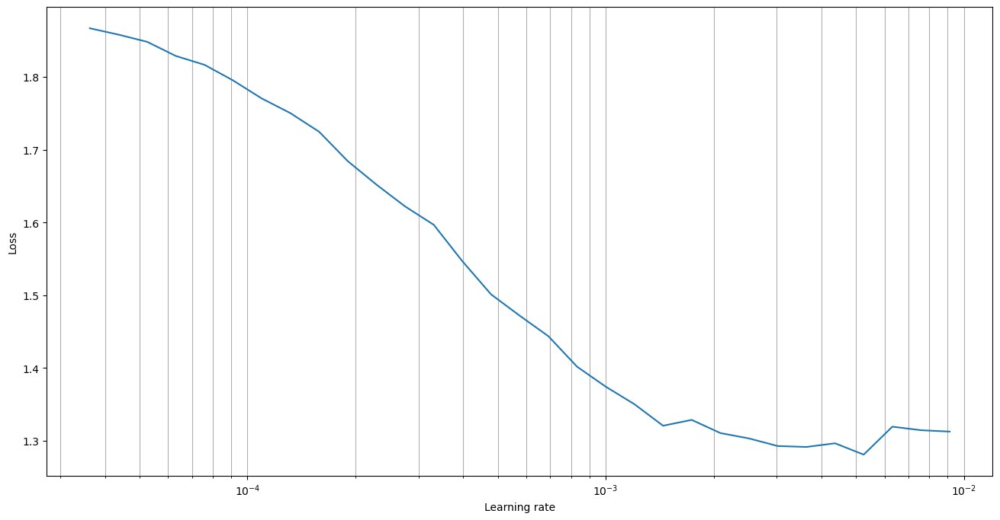

In [31]:
plot_lr_finder(lrs, losses, skip_start = 30, skip_end = 30)

Затем мы можем установить скорость обучения нашей модели, используя discriminative fine-tuning - технику, используемую в трансферном обучении, когда более поздние слои модели имеют более высокую скорость обучения, чем ранние.

Мы используем скорость обучения, найденную с помощью learning rate finder, в качестве максимальной скорости обучения, используемой в последнем слое, в то время как остальные слои имеют более низкую скорость обучения, постепенно уменьшающуюся по направлению к входу. 

In [32]:
FOUND_LR = 1e-3

params = [
          {'params': model.conv1.parameters(),  'lr': FOUND_LR / 10},
          {'params': model.bn1.parameters(),    'lr': FOUND_LR / 10},
          {'params': model.layer1.parameters(), 'lr': FOUND_LR / 8},
          {'params': model.layer2.parameters(), 'lr': FOUND_LR / 6},
          {'params': model.layer3.parameters(), 'lr': FOUND_LR / 4},
          {'params': model.layer4.parameters(), 'lr': FOUND_LR / 2},
          {'params': model.fc.parameters()}
         ]


optimizer = optim.Adam(params, lr = FOUND_LR)

Далее мы задаем планировщик скорости обучения. Планировщик скорости обучения динамически изменяет скорость обучения во время обучения модели. Мы будем использовать одноцикловый планировщик скорости обучения

In [33]:
EPOCHS = 10
STEPS_PER_EPOCH = len(train_iterator)
TOTAL_STEPS = EPOCHS * STEPS_PER_EPOCH

MAX_LRS = [p['lr'] for p in optimizer.param_groups]

scheduler = lr_scheduler.OneCycleLR(optimizer,
                                    max_lr = MAX_LRS,
                                    total_steps = TOTAL_STEPS)

Еще одна вещь, которую мы реализуем, - это top-k accuracy. Задача - отнести изображение к одному из 7 классов кекликов, однако некоторые из этих классов выглядят очень похоже, и человеку даже сложно правильно их обозначить. Поэтому при подсчете точности будем использовать более щадящую метрику.

Одна из таким метрик - top-k accuracy, при которой предсказание считается верным, если правильная метка находится в top-k предсказаний, а не просто является первой. Наша функция `calculate_topk_accuracy` вычисляет точность top-1, а также точность top-k, по умолчанию $k=5$.

Мы используем `.reshape` вместо view, так как при нарезке тензоров они становятся несмежными, а значит `.view` выдает ошибку.

In [38]:
def calculate_accuracy(y_pred, y):
    k = 1
    with torch.no_grad():
        batch_size = y.shape[0]
        _, top_pred = y_pred.topk(k, 1)
        top_pred = top_pred.t()
        correct = top_pred.eq(y.view(1, -1).expand_as(top_pred))
        correct_1 = correct[:1].reshape(-1).float().sum(0, keepdim = True)
        acc_1 = correct_1 / batch_size
    return acc_1

Далее следует функция обучения. Она похожа на все предыдущие, но с добавлением планировщика и вычисления/возвращения top-k accuracy.

Планировщик обновляется вызовом `scheduler.step()`. Его всегда следует вызывать **после** `optimizer.step()`, иначе первая скорость обучения планировщика будет пропущена. 

Не все планировщики нужно вызывать после каждой обучающей партии, некоторые вызываются только после каждой эпохи. В этом случае планировщик не нужно передавать в функцию `train` и его можно вызвать в основном цикле обучения.

In [40]:
def train(model, iterator, optimizer, criterion, scheduler, device):
    
    epoch_loss = 0
    epoch_acc_1 = 0
    epoch_acc_5 = 0
    
    model.train()
    
    for (x, y) in iterator:
        
        x = x.to(device)
        y = y.to(device)
        
        optimizer.zero_grad()
                
        y_pred, _ = model(x)
        
        loss = criterion(y_pred, y)
        
        acc_1 = calculate_accuracy(y_pred, y)
        
        loss.backward()
        
        optimizer.step()
        
        scheduler.step()
        
        epoch_loss += loss.item()
        epoch_acc_1 += acc_1.item()
        
    epoch_loss /= len(iterator)
    epoch_acc_1 /= len(iterator)
        
    return epoch_loss, epoch_acc_1

Поскольку планировщик одного цикла должен вызываться только после каждого обновления параметров, здесь он не вызывается, так как мы не обновляем параметры во время оценки.

In [42]:
def evaluate(model, iterator, criterion, device):
    
    epoch_loss = 0
    epoch_acc_1 = 0
    
    model.eval()
    
    with torch.no_grad():
        
        for (x, y) in iterator:

            x = x.to(device)
            y = y.to(device)

            y_pred, _ = model(x)

            loss = criterion(y_pred, y)

            acc_1 = calculate_accuracy(y_pred, y)

            epoch_loss += loss.item()
            epoch_acc_1 += acc_1.item()
        
    epoch_loss /= len(iterator)
    epoch_acc_1 /= len(iterator)
        
    return epoch_loss, epoch_acc_1

Далее небольшая вспомогательная функция, которая сообщает нам, сколько времени заняла эпоха.

In [43]:
def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

Мы можем приступить к обучению модели.

Мы получаем около 83 % точности валидации top-1.

In [44]:
best_valid_loss = float('inf')

for epoch in range(EPOCHS):
    
    start_time = time.monotonic()
    
    train_loss, train_acc_1 = train(model, train_iterator, optimizer, criterion, scheduler, device)
    valid_loss, valid_acc_1 = evaluate(model, valid_iterator, criterion, device)
        
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'tut5-model.pt')

    end_time = time.monotonic()

    epoch_mins, epoch_secs = epoch_time(start_time, end_time)
    
    print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
    print(f'\tTrain Loss: {train_loss:.3f} | Train Acc @1: {train_acc_1*100:6.2f}%')
    print(f'\tValid Loss: {valid_loss:.3f} | Valid Acc @1: {valid_acc_1*100:6.2f}%')

Epoch: 01 | Epoch Time: 1m 26s
	Train Loss: 0.810 | Train Acc @1:  71.53%
	Valid Loss: 0.706 | Valid Acc @1:  75.40%
Epoch: 02 | Epoch Time: 1m 1s
	Train Loss: 0.569 | Train Acc @1:  78.44%
	Valid Loss: 0.745 | Valid Acc @1:  77.64%
Epoch: 03 | Epoch Time: 1m 1s
	Train Loss: 0.541 | Train Acc @1:  80.05%
	Valid Loss: 0.650 | Valid Acc @1:  76.30%
Epoch: 04 | Epoch Time: 1m 1s
	Train Loss: 0.471 | Train Acc @1:  82.85%
	Valid Loss: 0.600 | Valid Acc @1:  77.65%
Epoch: 05 | Epoch Time: 1m 1s
	Train Loss: 0.420 | Train Acc @1:  84.57%
	Valid Loss: 0.586 | Valid Acc @1:  80.17%
Epoch: 06 | Epoch Time: 1m 1s
	Train Loss: 0.335 | Train Acc @1:  88.23%
	Valid Loss: 0.618 | Valid Acc @1:  81.67%
Epoch: 07 | Epoch Time: 1m 1s
	Train Loss: 0.270 | Train Acc @1:  90.38%
	Valid Loss: 0.592 | Valid Acc @1:  81.67%
Epoch: 08 | Epoch Time: 1m 1s
	Train Loss: 0.182 | Train Acc @1:  93.82%
	Valid Loss: 0.558 | Valid Acc @1:  83.59%
Epoch: 09 | Epoch Time: 1m 1s
	Train Loss: 0.112 | Train Acc @1:  96.14

Для тестовой выборки точность даже немного выше, чем для вылидационной - почти 86 %.

In [45]:
model.load_state_dict(torch.load('tut5-model.pt'))

test_loss, test_acc_1 = evaluate(model, test_iterator, criterion, device)

print(f'Test Loss: {test_loss:.3f} | Test Acc @1: {test_acc_1*100:6.2f}% | ')

Test Loss: 0.498 | Test Acc @1:  85.73% | 


# Анализ модели

Сначала мы получим предсказания для каждого изображения в тестовом наборе...

In [46]:
def get_predictions(model, iterator):

    model.eval()

    images = []
    labels = []
    probs = []

    with torch.no_grad():

        for (x, y) in iterator:

            x = x.to(device)

            y_pred, _ = model(x)

            y_prob = F.softmax(y_pred, dim = -1)
            top_pred = y_prob.argmax(1, keepdim = True)

            images.append(x.cpu())
            labels.append(y.cpu())
            probs.append(y_prob.cpu())

    images = torch.cat(images, dim = 0)
    labels = torch.cat(labels, dim = 0)
    probs = torch.cat(probs, dim = 0)

    return images, labels, probs

In [47]:
images, labels, probs = get_predictions(model, test_iterator)

... которые затем используем для получения предсказанных меток.

In [48]:
pred_labels = torch.argmax(probs, 1)

Затем мы используем эти метки для построения confusion matrix.

In [51]:
def plot_confusion_matrix(labels, pred_labels, classes):
    
    fig = plt.figure(figsize = (10, 10));
    ax = fig.add_subplot(1, 1, 1);
    cm = confusion_matrix(labels, pred_labels);
    cm = ConfusionMatrixDisplay(cm, display_labels = classes);
    cm.plot(values_format = 'd', cmap = 'Blues', ax = ax)
    fig.delaxes(fig.axes[1]) #delete colorbar
    plt.xticks(rotation = 90)
    plt.xlabel('Predicted Label', fontsize = 14)
    plt.ylabel('True Label', fontsize = 14)

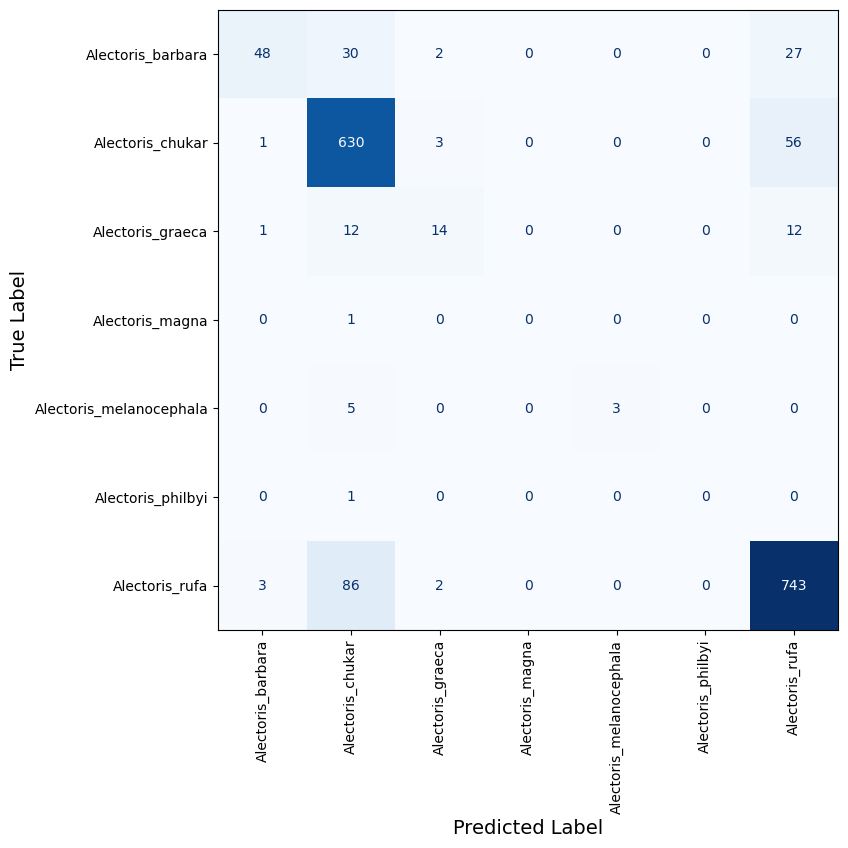

In [52]:
plot_confusion_matrix(labels, pred_labels, classes)

Мы можем получить все правильные предсказания, отфильтровать их, а затем отсортировать все неправильные предсказания в зависимости от того, насколько они были уверены в своем неправильном предсказании.

In [53]:
corrects = torch.eq(labels, pred_labels)

In [54]:
incorrect_examples = []

for image, label, prob, correct in zip(images, labels, probs, corrects):
    if not correct:
        incorrect_examples.append((image, label, prob))

incorrect_examples.sort(reverse = True, key = lambda x: torch.max(x[2], dim = 0).values)

Mы можем построить график наиболее неверно предсказанных изображений вместе с предсказанным классом и реальным классом. 

In [55]:
def plot_most_incorrect(incorrect, classes, n_images, normalize = True):

    rows = int(np.sqrt(n_images))
    cols = int(np.sqrt(n_images))

    fig = plt.figure(figsize = (25, 20))

    for i in range(rows*cols):

        ax = fig.add_subplot(rows, cols, i+1)
        
        image, true_label, probs = incorrect[i]
        image = image.permute(1, 2, 0)
        true_prob = probs[true_label]
        incorrect_prob, incorrect_label = torch.max(probs, dim = 0)
        true_class = classes[true_label]
        incorrect_class = classes[incorrect_label]

        if normalize:
            image = normalize_image(image)

        ax.imshow(image.cpu().numpy())
        ax.set_title(f'true label: {true_class} ({true_prob:.3f})\n' \
                     f'pred label: {incorrect_class} ({incorrect_prob:.3f})')
        ax.axis('off')
        
    fig.subplots_adjust(hspace=0.4)

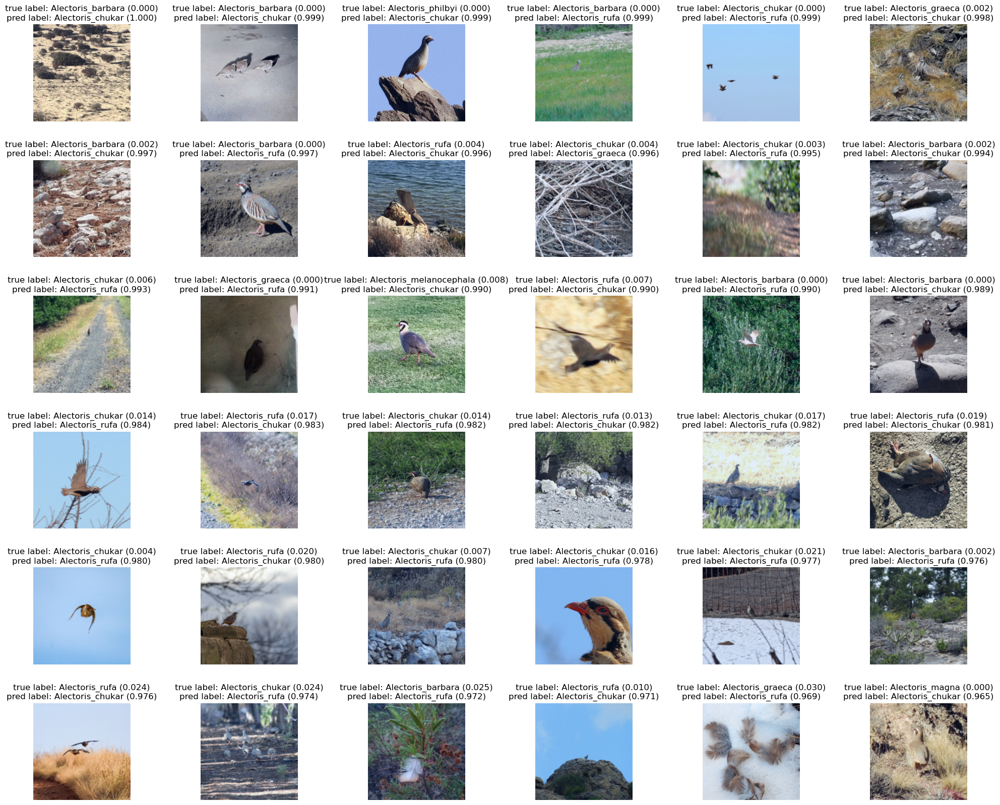

In [56]:
N_IMAGES = 36

plot_most_incorrect(incorrect_examples, classes, N_IMAGES)

Мы также можем получить представления из модели, чтобы выполнить некоторые методы уменьшения размерности.

Будем получать только выходные представления, а не промежуточные.

In [57]:
def get_representations(model, iterator):

    model.eval()

    outputs = []
    intermediates = []
    labels = []

    with torch.no_grad():
        
        for (x, y) in iterator:

            x = x.to(device)

            y_pred, _ = model(x)

            outputs.append(y_pred.cpu())
            labels.append(y)
        
    outputs = torch.cat(outputs, dim = 0)
    labels = torch.cat(labels, dim = 0)

    return outputs, labels

In [58]:
outputs, labels = get_representations(model, train_iterator)

Затем мы можем выполнить PCA для этих представлений, чтобы построить их в двух измерениях.

In [59]:
def get_pca(data, n_components = 2):
    pca = decomposition.PCA()
    pca.n_components = n_components
    pca_data = pca.fit_transform(data)
    return pca_data

In [68]:
def plot_representations(data, labels, classes, n_images = None):
            
    if n_images is not None:
        data = data[:n_images]
        labels = labels[:n_images]
                
    fig = plt.figure(figsize = (10, 10))
    ax = fig.add_subplot(111)
    scatter = ax.scatter(data[:, 0], data[:, 1], c = labels, cmap = 'Set1')
    handles, _ = scatter.legend_elements(num = None)
    legend = plt.legend(handles = handles, labels = classes)

Видно, что относительно хорошо разделимо только 3-4 класса.

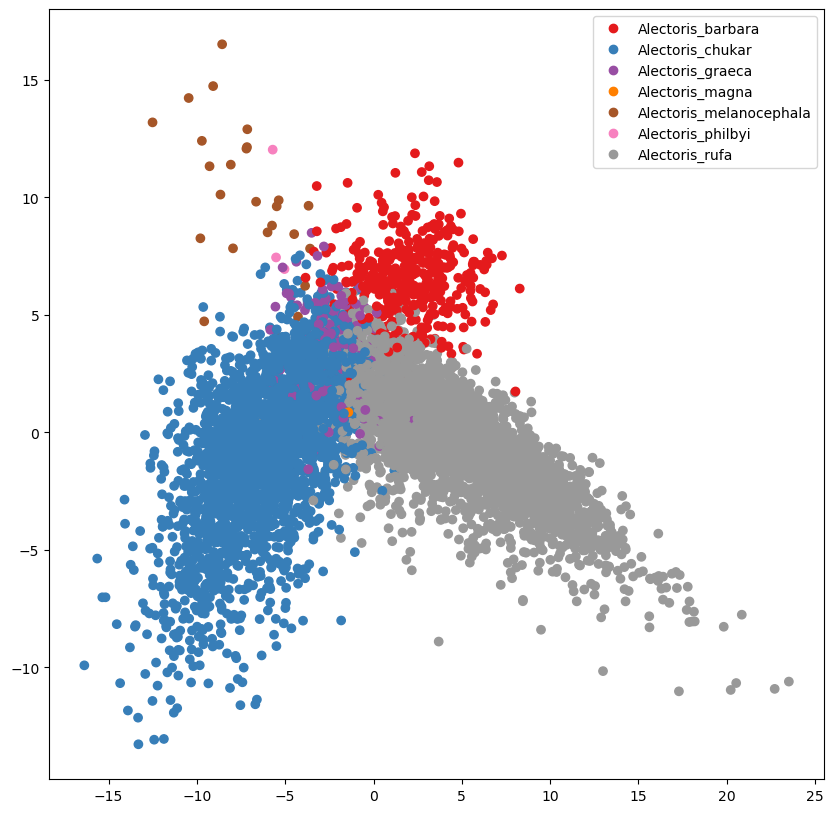

In [69]:
output_pca_data = get_pca(outputs)
plot_representations(output_pca_data, labels, classes)

Далее мы построим график данных t-SNE.

In [70]:
def get_tsne(data, n_components = 2, n_images = None):
    
    if n_images is not None:
        data = data[:n_images]
        
    tsne = manifold.TSNE(n_components = n_components, random_state = 0)
    tsne_data = tsne.fit_transform(data)
    return tsne_data

В данном случае классы довольно хорошо разделимы.

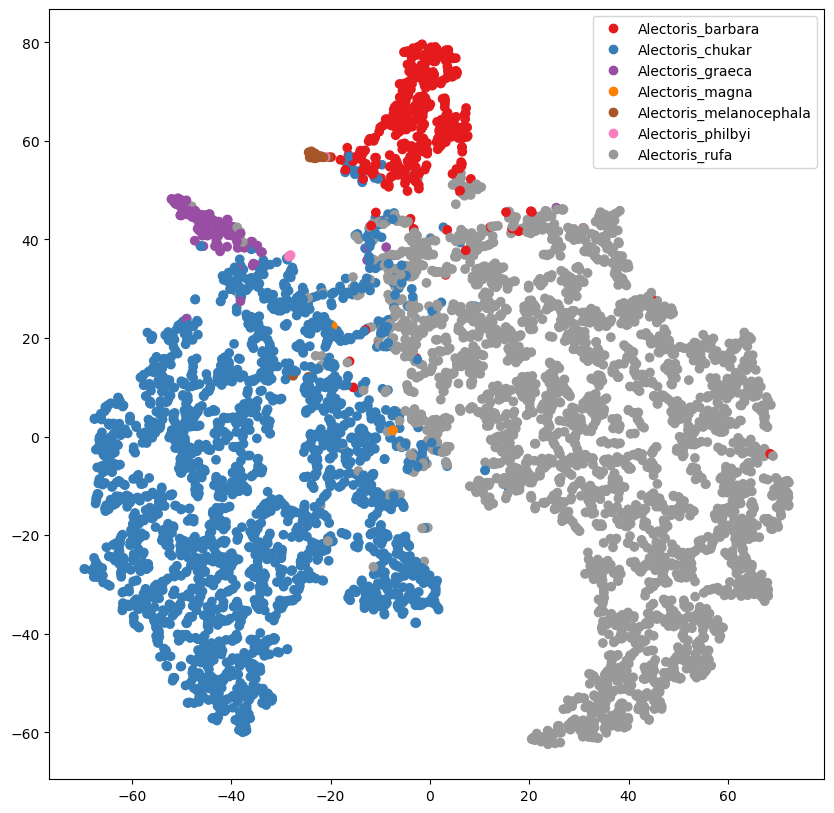

In [71]:
output_tsne_data = get_tsne(outputs)
plot_representations(output_tsne_data, labels, classes)

Мы можем построить график того, как выглядят несколько изображений, прошедших через первый конволюционный слой.

In [72]:
def plot_filtered_images(images, filters, n_filters = None, normalize = True):

    images = torch.cat([i.unsqueeze(0) for i in images], dim = 0).cpu()
    filters = filters.cpu()

    if n_filters is not None:
        filters = filters[:n_filters]

    n_images = images.shape[0]
    n_filters = filters.shape[0]

    filtered_images = F.conv2d(images, filters)

    fig = plt.figure(figsize = (30, 30))

    for i in range(n_images):

        image = images[i]

        if normalize:
            image = normalize_image(image)

        ax = fig.add_subplot(n_images, n_filters+1, i+1+(i*n_filters))
        ax.imshow(image.permute(1,2,0).numpy())
        ax.set_title('Original')
        ax.axis('off')

        for j in range(n_filters):
            image = filtered_images[i][j]

            if normalize:
                image = normalize_image(image)

            ax = fig.add_subplot(n_images, n_filters+1, i+1+(i*n_filters)+j+1)
            ax.imshow(image.numpy(), cmap = 'bone')
            ax.set_title(f'Filter {j+1}')
            ax.axis('off');

    fig.subplots_adjust(hspace = -0.7)

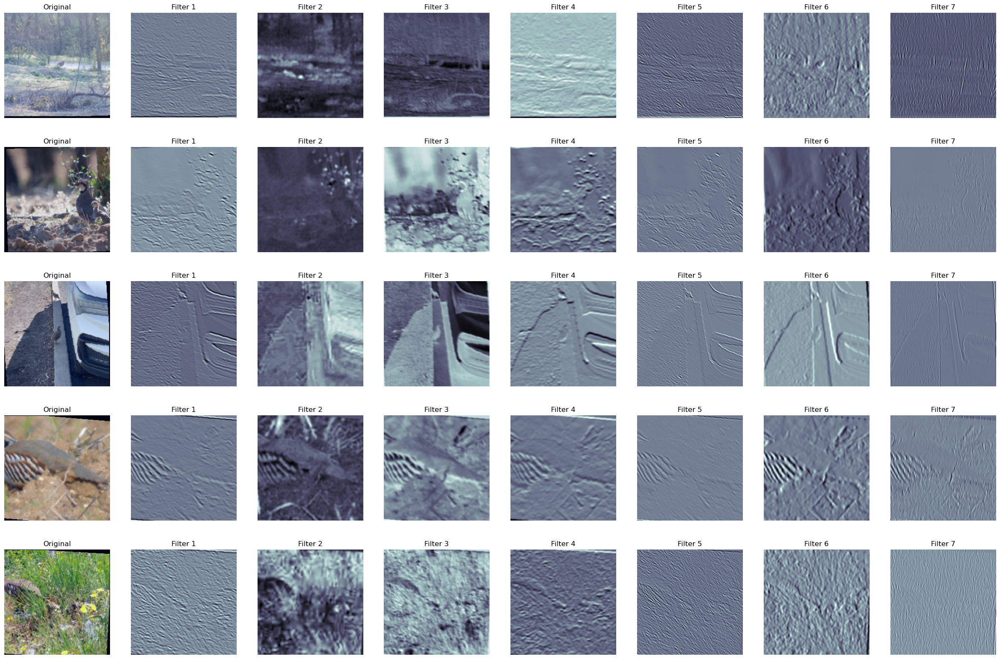

In [73]:
N_IMAGES = 5
N_FILTERS = 7

images = [image for image, label in [train_data[i] for i in range(N_IMAGES)]]
filters = model.conv1.weight.data

plot_filtered_images(images, filters, N_FILTERS)

Наконец, мы можем построить график значений самих фильтров.

In [80]:
def plot_filters(filters, normalize = True):

    filters = filters.cpu()

    n_filters = filters.shape[0]

    rows = int(np.sqrt(n_filters))
    cols = int(np.sqrt(n_filters))

    fig = plt.figure(figsize = (15, 7))

    for i in range(rows*cols):

        image = filters[i]

        if normalize:
            image = normalize_image(image)

        ax = fig.add_subplot(rows, cols, i+1)
        ax.imshow(image.permute(1, 2, 0))
        ax.axis('off')
        
    fig.subplots_adjust(wspace = -0.9)

В этих фильтрах есть несколько интересных паттернов, однако все они уже присутствовали в предварительно обученной модели ResNet. Скорее всего, скорость обучения этого начального конволюционного слоя была слишком мала, чтобы существенно их изменить.

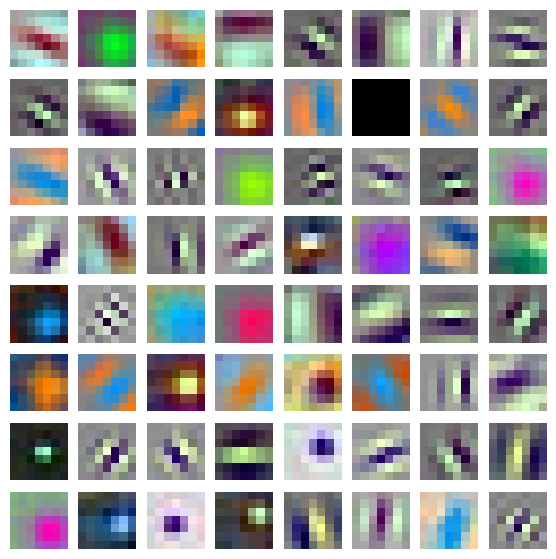

In [81]:
plot_filters(filters)